## Overview

This script performs EDA and then preprocesses multiple datasets to train a bidirectional LSTM model which is in turn used to predict the sentiments behind tweets fetched in real time using `tweepy` and classify them as positive negative or neutral.

The model is then integrated with streamlit and deployed as a web-app.

**Checkout the web-app:** [Sententia](https://share.streamlit.io/kritanjalijain/twitter_sentiment_analysis/main/app.py)

## Installing and importing dependencies

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing
import os


#For Preprocessing
import re    # RegEx for removing non-letter characters
import nltk  #natural language processing
nltk.download("stopwords")
nltk.download("wordnet")
nltk.data.path.append('/kaggle/input')
from nltk.corpus import stopwords , wordnet
from nltk.stem.porter import *
from nltk.stem import WordNetLemmatizer
# For Building the model
from sklearn.model_selection import train_test_split
import tensorflow as tf
import seaborn as sns

#For data visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline

pd.options.plotting.backend = "plotly"

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


### Cleaning and prepping dataset

In [2]:
df=pd.read_csv("/kaggle/input/sentiment-dataset-with-1-million-tweets/dataset.csv")
df.head()

,Text,Language,Label
0,@Charlie_Corley @Kristine1G @amyklobuchar @Sty...,en,litigious
1,#BadBunny: Como dos gotas de agua: Joven se di...,es,negative
2,https://t.co/YJNiO0p1JV Flagstar Bank disclose...,en,litigious
3,Rwanda is set to host the headquarters of Unit...,en,positive
4,OOPS. I typed her name incorrectly (today’s br...,en,litigious


In [3]:
print("Dataset Length: ", len(df))

Dataset Length:  937854


In [4]:
df['Language'].unique()

array(['en', 'es', 'ca', 'fr', 'pt', 'ja', 'hi', 'ar', 'ko', 'nl', 'et',
       'in', 'und', 'tl', 'zh', 'de', 'cs', 'ru', 'qme', 'it', 'el', 'ro',
       'no', 'tr', 'sv', 'ta', 'fa', 'ht', 'pl', 'da', 'th', 'hu', 'lv',
       'uk', 'qht', 'eu', 'qam', 'si', 'cy', 'zxx', 'ml', 'ne', 'mr',
       'qst', 'vi', 'bn', 'gu', 'is', 'fi', 'ckb', nan, 'te', 'art', 'bg',
       'ur', 'sl', 'lt', 'pa', 'iw', 'kn', 'sr',
       "[Photo(previewUrl='https://pbs.twimg.com/media/FWV94O7UEAAjMOi?format=jpg&name=small', fullUrl='https://pbs.twimg.com/media/FWV94O7UEAAjMOi?format=jpg&name=large')]",
       "[Photo(previewUrl='https://pbs.twimg.com/media/FWWBzWTXkAAyZqm?format=jpg&name=small', fullUrl='https://pbs.twimg.com/media/FWWBzWTXkAAyZqm?format=jpg&name=large')]",
       'am', 'or',
       "[Photo(previewUrl='https://pbs.twimg.com/media/EPYG2rKVAAA1e_O?format=jpg&name=small', fullUrl='https://pbs.twimg.com/media/EPYG2rKVAAA1e_O?format=jpg&name=large')]",
       'sd',
       "[Photo(previewUrl='h

In [5]:
df['Label'] = df['Label'].map({"negative":-1.0, "positive": 1.0 })
df = df.drop(['Language'], axis=1)
df = df.rename(columns={'Text': 'clean_text', 'Label':'category'})
df.head()

,clean_text,category
0,@Charlie_Corley @Kristine1G @amyklobuchar @Sty...,NaN
1,#BadBunny: Como dos gotas de agua: Joven se di...,-1.0
2,https://t.co/YJNiO0p1JV Flagstar Bank disclose...,NaN
3,Rwanda is set to host the headquarters of Unit...,1.0
4,OOPS. I typed her name incorrectly (today’s br...,NaN


In [6]:
df.dropna(axis=0, inplace=True)
df.head()

,clean_text,category
1,#BadBunny: Como dos gotas de agua: Joven se di...,-1.0
3,Rwanda is set to host the headquarters of Unit...,1.0
5,It sucks for me since I'm focused on the natur...,-1.0
6,@en_font Treballar a l’obra a partir dels 19 a...,-1.0
8,Social Security. Constant political crises dis...,-1.0


## Exploratory Data Analysis

Data Visualisation-

In [7]:
df['category'] = df['category'].map({-1.0:"negative", 1.0:"positive" })

In [8]:
df.groupby('category').count()

,clean_text
category,
negative,262220
positive,264545


In [9]:
# The distribution of sentiments
df.groupby('category').count().plot(kind='bar')

Plotting the distribution of tweet lengths

In [10]:
# Calculate tweet lengths
tweet_len = pd.Series([len(tweet.split()) for tweet in df['clean_text']])

# The distribution of tweet text lengths
tweet_len.plot(kind='box')

In [11]:
positive_tweets_length = pd.Series([len(tweet.split()) for tweet in df[df['category'] == 'positive']['clean_text']])
negative_tweets_length = pd.Series([len(tweet.split()) for tweet in df[df['category'] == 'negative']['clean_text']])
print("Positive tweets length description: ")
print(positive_tweets_length.describe())
print("Negative tweets length description: ")
print(negative_tweets_length.describe())

Positive tweets length description: 
count    264545.000000
mean         23.523178
std          14.914757
min           1.000000
25%          11.000000
50%          21.000000
75%          35.000000
max         108.000000
dtype: float64
Negative tweets length description: 
count    262220.000000
mean         26.062097
std          15.857664
min           1.000000
25%          12.000000
50%          23.000000
75%          40.000000
max         108.000000
dtype: float64


Plotting the Pie chart of the percentage of different sentiments of all the tweets

In [12]:
import plotly.express as px
fig = px.pie(df, names='category', title ='Pie chart of different sentiments of tweets')
fig.show()

## Data Preprocessing

In [13]:
def remove_URL(text):
    url = re.compile(r'https?://\S+|www\.\S+')
    return url.sub(r'', text)


def remove_emoji(text):
    emoji_pattern = re.compile(
        '['
        u'\U0001F600-\U0001F64F'  # emoticons
        u'\U0001F300-\U0001F5FF'  # symbols & pictographs
        u'\U0001F680-\U0001F6FF'  # transport & map symbols
        u'\U0001F1E0-\U0001F1FF'  # flags (iOS)
        u'\U00002702-\U000027B0'
        u'\U000024C2-\U0001F251'
        ']+',
        flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)


def remove_html(text):
    html = re.compile(r'^[^ ]<.*?>|&([a-z0-9]+|#[0-9]\"\'\“{1,6}|#x[0-9a-f]{1,6});[^A-Za-z0-9]+')
    return re.sub(html, '', text)


def remove_quotes(text):
    quotes = re.compile(r'[^A-Za-z0-9\s]+')
    return re.sub(quotes, '', text)

def remove_numbers(text):
    numbers = re.compile(r'[^A-Za-z\s]+')
    return re.sub(numbers , '' , text)

# Applying helper functions

df['clean_text'] = df['clean_text'].apply(lambda x: remove_URL(x))
df['clean_text'] = df['clean_text'].apply(lambda x: remove_emoji(x))
df['clean_text'] = df['clean_text'].apply(lambda x: remove_html(x))
df['clean_text'] = df['clean_text'].apply(lambda x: remove_quotes(x))
df['clean_text'] = df['clean_text'].apply(lambda x: remove_numbers(x))

df.head()

,clean_text,category
1,BadBunny Como dos gotas de agua Joven se disfr...,negative
3,Rwanda is set to host the headquarters of Unit...,positive
5,It sucks for me since Im focused on the nature...,negative
6,enfont Treballar a lobra a partir dels anys f...,negative
8,Social Security Constant political crises dist...,negative


In [14]:
from nltk.tag import pos_tag

stop_words =  set(stopwords.words('english'))
stop_words.remove('not')

def remove_stopwords(words):
    words = [word for word in words if word not in stop_words]
    return words

def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN 
    
lemmatizer = WordNetLemmatizer()

def lemmatized_words(words):
    tag_pos = pos_tag(words)
    words_tag = [(word, get_wordnet_pos(pos_tag)) for (word, pos_tag) in tag_pos]
    lemmatized_words = [lemmatizer.lemmatize(word, tag) for word, tag in words_tag]
    return lemmatized_words

df['tokens'] = df['clean_text'].apply(lambda x : remove_stopwords(x.split()))
df.tokens = df.tokens.apply(lambda x: lemmatized_words(x))
df.head()

,clean_text,category,tokens
1,BadBunny Como dos gotas de agua Joven se disfr...,negative,"[BadBunny, Como, dos, gotas, de, agua, Joven, ..."
3,Rwanda is set to host the headquarters of Unit...,positive,"[Rwanda, set, host, headquarters, United, Nati..."
5,It sucks for me since Im focused on the nature...,negative,"[It, suck, since, Im, focus, nature, aspect, t..."
6,enfont Treballar a lobra a partir dels anys f...,negative,"[enfont, Treballar, lobra, partir, dels, anys,..."
8,Social Security Constant political crises dist...,negative,"[Social, Security, Constant, political, crisis..."


In [15]:
df.tokens = df.tokens.apply(lambda x: [word.lower() for word in x])
df.head()

,clean_text,category,tokens
1,BadBunny Como dos gotas de agua Joven se disfr...,negative,"[badbunny, como, dos, gotas, de, agua, joven, ..."
3,Rwanda is set to host the headquarters of Unit...,positive,"[rwanda, set, host, headquarters, united, nati..."
5,It sucks for me since Im focused on the nature...,negative,"[it, suck, since, im, focus, nature, aspect, t..."
6,enfont Treballar a lobra a partir dels anys f...,negative,"[enfont, treballar, lobra, partir, dels, anys,..."
8,Social Security Constant political crises dist...,negative,"[social, security, constant, political, crisis..."


In [16]:
df.to_csv('tokenized-df-1-million.csv')

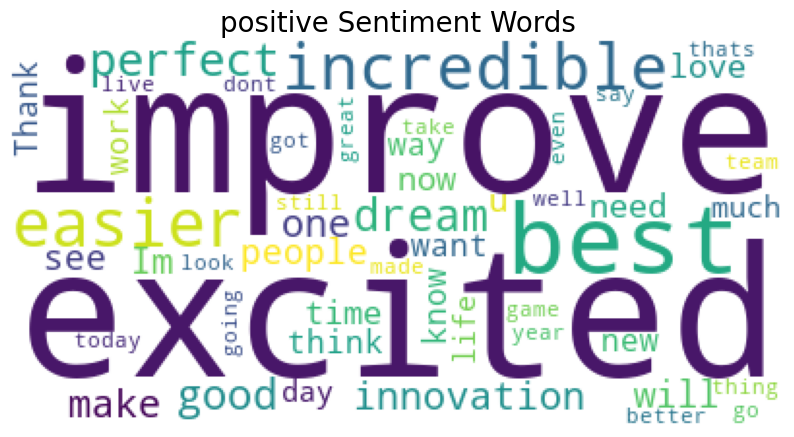

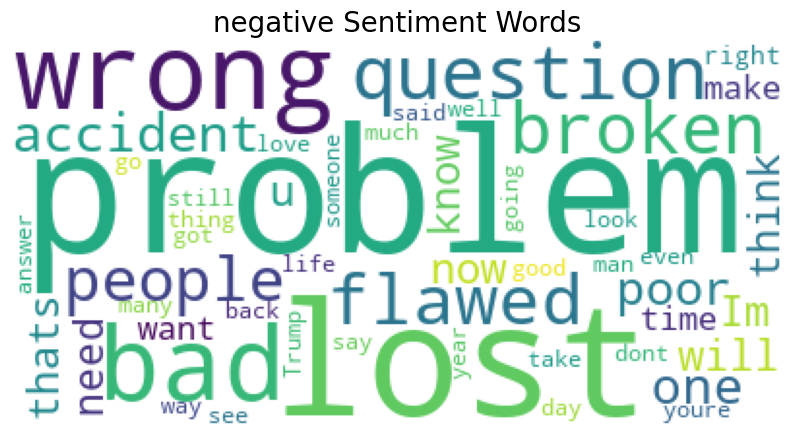

In [17]:
#### Visualizing data into wordclouds


from wordcloud import WordCloud, STOPWORDS

def wordcount_gen(df, category):
    '''
    Generating Word Cloud
    inputs:
       - df: tweets dataset
       - category: Positive/Negative
    '''
    # Combine all tweets
    combined_tweets = " ".join([tweet for tweet in df[df.category==category]['clean_text']])

    # Initialize wordcloud object
    wc = WordCloud(background_color='white',
                   max_words=50,
                   stopwords = STOPWORDS)

    # Generate and plot wordcloud
    plt.figure(figsize=(10,10))
    plt.imshow(wc.generate(combined_tweets))
    plt.title('{} Sentiment Words'.format(category), fontsize=20)
    plt.axis('off')
    plt.show()

# Positive tweet words
wordcount_gen(df, 'positive')

# Negative tweet words
wordcount_gen(df, 'negative')

# Neutral tweet words



### Train and test split

In [18]:
# X = df.tokens
# y = pd.get_dummies(df['category'])
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
# X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

### Tokenize and Padding

In [19]:
from keras.preprocessing.text import Tokenizer
# from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import pad_sequences


max_words = 20000
max_len=50

def tokenize_pad_sequences(text):
    '''
    This function tokenize the input text into sequnences of intergers and then
    pad each sequence to the same length
    '''
    # Text tokenization
    tokenizer = Tokenizer(num_words=max_words, lower=True, split=' ')
    tokenizer.fit_on_texts(text)
    # Transforms text to a sequence of integers
    X = tokenizer.texts_to_sequences(text)
    # Pad sequences to the same length
    X = pad_sequences(X, padding='post', maxlen=max_len)
    # return sequences
    return X, tokenizer

# print('Before Tokenization & Padding \n', df['clean_text'][0])
X, tokenizer = tokenize_pad_sequences(df['clean_text'])
# print('After Tokenization & Padding \n', X[0])

In [20]:
# unique words in the dataset
vocab_size = len(tokenizer.word_index) + 1
print('Vocab size: ', vocab_size)

Vocab size:  578956


### Saving tokenized data

In [21]:
import pickle

# saving
with open('tokenizer.pickle', 'wb') as handle:
    pickle.dump(tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)

# loading
with open('tokenizer.pickle', 'rb') as handle:
    tokenizer = pickle.load(handle)

### Train & Test Split

In [22]:
y = pd.get_dummies(df['category'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)
print('Train Set ->', X_train.shape, y_train.shape)
print('Validation Set ->', X_val.shape, y_val.shape)
print('Test Set ->', X_test.shape, y_test.shape)

Train Set -> (316059, 50) (316059, 2)
Validation Set -> (105353, 50) (105353, 2)
Test Set -> (105353, 50) (105353, 2)


In [23]:
import keras.backend as K

def f1_score(precision, recall):
    ''' Function to calculate f1 score '''

    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

## Bidirectional LSTM Using CNN

In [24]:
from keras.models import Sequential
from keras.layers import Embedding, Conv1D, MaxPooling1D, Bidirectional, LSTM, Dense, Dropout
from keras.metrics import Precision, Recall
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras import datasets

from keras.callbacks import LearningRateScheduler
from keras.callbacks import History

from keras import losses

vocab_size = 20000
embedding_size = 32
epochs=20
learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

sgd = SGD(learning_rate=learning_rate, momentum=momentum, nesterov=False)
# Build model
model_ne= Sequential()
model_ne.add(Embedding(vocab_size, embedding_size, input_length=max_len))
model_ne.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu'))
model_ne.add(MaxPooling1D(pool_size=2))
model_ne.add(Dropout(0.4))
model_ne.add(Conv1D(filters=64, kernel_size=3, padding='same', activation='relu'))
model_ne.add(MaxPooling1D(pool_size=2))
model_ne.add(Dropout(0.4))
model_ne.add(LSTM(32))
model_ne.add(Dropout(0.4))
model_ne.add(Dense(2, activation='softmax'))

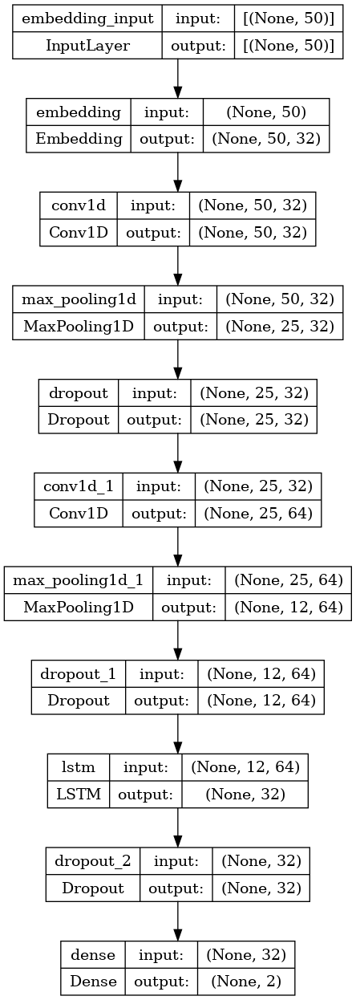

In [25]:
import tensorflow as tf
tf.keras.utils.plot_model(model_ne, show_shapes=True)

In [26]:
print(model_ne.summary())

# Compile model
model_ne.compile(loss='binary_crossentropy', optimizer=sgd,
               metrics=['accuracy', Precision(), Recall()])

# Train model

batch_size = 64
history2 = model_ne.fit(X_train, y_train,
                      validation_data=(X_val, y_val),
                      batch_size=batch_size, epochs=20, verbose=1)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 50, 32)            640000    
                                                                 
 conv1d (Conv1D)             (None, 50, 32)            3104      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 25, 32)           0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 25, 32)            0         
                                                                 
 conv1d_1 (Conv1D)           (None, 25, 64)            6208      
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 12, 64)           0         
 1D)                                                    

### Model Accuracy & Loss

In [27]:
# Evaluate model on the test set
loss, accuracy, precision, recall = model_ne.evaluate(X_test, y_test, verbose=0)
# Print metrics
print('')
print('Accuracy  : {:.4f}'.format(accuracy))
print('Precision : {:.4f}'.format(precision))
print('Recall    : {:.4f}'.format(recall))
print('F1 Score  : {:.4f}'.format(f1_score(precision, recall)))


Accuracy  : 0.9795
Precision : 0.9795
Recall    : 0.9795
F1 Score  : 0.9795


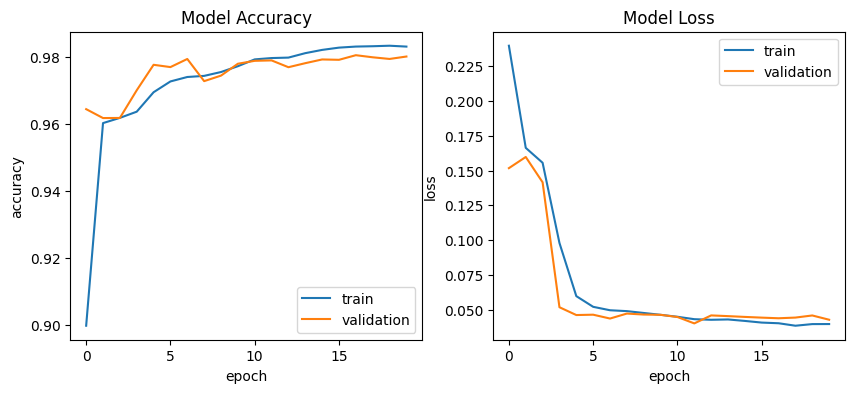

In [28]:
def plot_training_hist(history):
    '''Function to plot history for accuracy and loss'''

    fig, ax = plt.subplots(1, 2, figsize=(10,4))
    # first plot
    ax[0].plot(history.history['accuracy'])
    ax[0].plot(history.history['val_accuracy'])
    ax[0].set_title('Model Accuracy')
    ax[0].set_xlabel('epoch')
    ax[0].set_ylabel('accuracy')
    ax[0].legend(['train', 'validation'], loc='best')
    # second plot
    ax[1].plot(history.history['loss'])
    ax[1].plot(history.history['val_loss'])
    ax[1].set_title('Model Loss')
    ax[1].set_xlabel('epoch')
    ax[1].set_ylabel('loss')
    ax[1].legend(['train', 'validation'], loc='best')

plot_training_hist(history2)

### Model Confusion Matrix

3293/3293 [==============================] - 7s 2ms/step


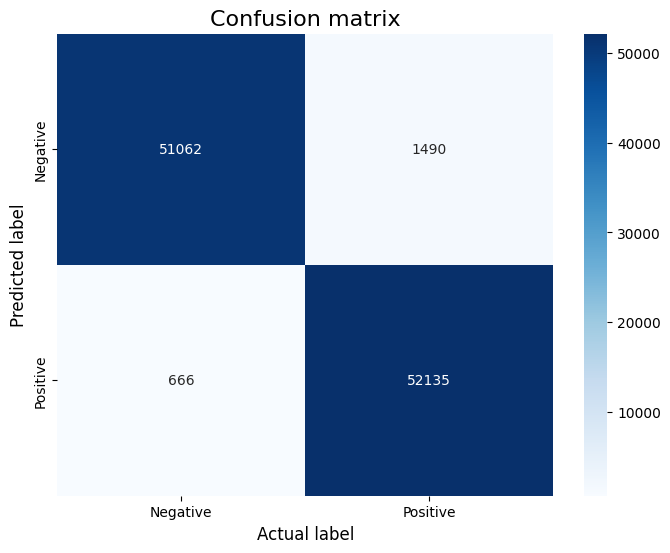

In [29]:
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(model, X_test, y_test):
    '''Function to plot confusion matrix for the passed model and the data'''

    sentiment_classes = ['Negative', 'Positive']
    # use model to do the prediction
    y_pred = model.predict(X_test)
    # compute confusion matrix
    cm = confusion_matrix(np.argmax(np.array(y_test),axis=1), np.argmax(y_pred, axis=1))
    # plot confusion matrix
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, cmap=plt.cm.Blues, annot=True, fmt='d',
                xticklabels=sentiment_classes,
                yticklabels=sentiment_classes)
    plt.title('Confusion matrix', fontsize=16)
    plt.xlabel('Actual label', fontsize=12)
    plt.ylabel('Predicted label', fontsize=12)

plot_confusion_matrix(model_ne, X_test, y_test)

### Model save and load for the prediction

In [30]:
# Save the model architecture & the weights
model_ne.save('1-million-dataset.h5')
print('Model saved')

Model saved


In [31]:
from keras.models import load_model

# Load model
model = load_model('1-million-dataset.h5')

def predict_class(text):
    '''Function to predict sentiment class of the passed text'''

    sentiment_classes = [ 'positive','negative']
    max_len=50

    # Transforms text to a sequence of integers using a tokenizer object
    xt = tokenizer.texts_to_sequences(text)
    # Pad sequences to the same length
    xt = pad_sequences(xt, padding='post', maxlen=max_len)
    # Do the prediction using the loaded model
    yt = model.predict(xt)
    if(yt[0][0] < yt[0][1]):
        print("The sentence is Positive, Confidence: ",yt[0][1])
    else:
        print("The sentence is Negative, Confidence: ",yt[0][0])

In [32]:
predict_class(['I hate when I have to call and wake people up'])

1/1 [==============================] - 0s 486ms/step
The sentence is Negative, Confidence:  0.81794983


In [33]:
predict_class(['The food was meh'])

1/1 [==============================] - 0s 19ms/step
The sentence is Positive, Confidence:  0.74539226


In [34]:
predict_class(['He is the best minister'])

1/1 [==============================] - 0s 21ms/step
The sentence is Positive, Confidence:  0.9999956


In [35]:
predict_class(['i love the idea'])

1/1 [==============================] - 0s 19ms/step
The sentence is Positive, Confidence:  0.7477471
